In [ ]:
!git clone https://github.com/Jessieweneedtocook/SPV.git

Cloning into 'SPV'...
remote: Enumerating objects: 2698, done.
remote: Counting objects: 100% (106/106), done.
remote: Compressing objects: 100% (71/71), done.
remote: Total 2698 (delta 60), reused 79 (delta 35), pack-reused 2592 (from 2)
Receiving objects: 100% (2698/2698), 54.45 MiB | 16.87 MiB/s, done.
Resolving deltas: 100% (983/983), done.


In [ ]:
%cd SPV

/content/SPV


In [ ]:
!pip install .

Processing /content/SPV
  Preparing metadata (setup.py) ... done
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-install-9j4qtr1y/clip_ff55dde5a66c44bd82e3934cd581cede
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-install-9j4qtr1y/clip_ff55dde5a66c44bd82e3934cd581cede
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
  Cloning https://github.com/Shilin-LU/VINE.git to /tmp/pip-install-9j4qtr1y/diffusers_ab2f6f955b5440449ba8957d6aec783c
  Running command git clone --filter=blob:none --quiet https://github.com/Shilin-LU/VINE.git /tmp/pip-install-9j4qtr1y/diffusers_ab2f6f955b5440449ba8957d6aec783c
  Resolved https://github.com/Shilin-LU/VINE.git to commit c3523ff5a3e4433a5942a238ba220d2092ae25ad
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━

In [ ]:
!pip install datasets diffusers transformers accelerate

In [ ]:
import torch.nn.functional as F
import torch.nn as nn
import torch
import timm
class StabilityPredictor(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = timm.create_model("convnext_tiny", pretrained=True, features_only=True)
        self.decoder = nn.Sequential(
            nn.Conv2d(768, 256, 3, padding=1),
            nn.ReLU(),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(256, 64, 3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 1, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.encoder(x)[-1]              # [B, 96, 8, 8]
        x = self.decoder(x)                  # [B, 1, 16, 16]
        x = F.interpolate(x, size=(256, 256), mode='bilinear', align_corners=False)
        return x

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"

model = StabilityPredictor().to(device)
model.load_state_dict(torch.load("/content/drive/MyDrive/stability_predictor.pth", map_location=device))
model.eval()

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/114M [00:00<?, ?B/s]

StabilityPredictor(
  (encoder): FeatureListNet(
    (stem_0): Conv2d(3, 96, kernel_size=(4, 4), stride=(4, 4))
    (stem_1): LayerNorm2d((96,), eps=1e-06, elementwise_affine=True)
    (stages_0): ConvNeXtStage(
      (downsample): Identity()
      (blocks): Sequential(
        (0): ConvNeXtBlock(
          (conv_dw): Conv2d(96, 96, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=96)
          (norm): LayerNorm((96,), eps=1e-06, elementwise_affine=True)
          (mlp): Mlp(
            (fc1): Linear(in_features=96, out_features=384, bias=True)
            (act): GELU()
            (drop1): Dropout(p=0.0, inplace=False)
            (norm): Identity()
            (fc2): Linear(in_features=384, out_features=96, bias=True)
            (drop2): Dropout(p=0.0, inplace=False)
          )
          (shortcut): Identity()
          (drop_path): Identity()
        )
        (1): ConvNeXtBlock(
          (conv_dw): Conv2d(96, 96, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), group

In [ ]:
from vine.src.vine_turbo import VINE_Turbo, VAE_encode, VAE_decode, initialize_unet_no_lora, initialize_vae_no_lora
from vine.src.stega_encoder_decoder import ConditionAdaptor, CustomConvNeXt
from vine.src.model import make_1step_sched
from accelerate.utils import set_seed
import torch, os, gc
import torch.nn as nn

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# for p in model.parameters():
#     p.requires_grad = False


watermarker = VINE_Turbo(
    ckpt_path=None,
    device='cuda',
    stability_predictor=model,
    tensor_six=False
)
watermarker.load_state_dict(torch.load("/content/drive/MyDrive/wm_finetuned2_epochRB2.pth"))
watermarker.to(device)
watermarker.train()
for p in watermarker.parameters():
    p.requires_grad = True

watermarker.stability_predictor.eval()
for p in watermarker.stability_predictor.parameters():
    p.requires_grad = False


decoder = CustomConvNeXt(secret_size=100).to(device)
decoder.convnext.classifier = nn.Sequential(
    nn.Flatten(1),
    nn.Linear(1024, 100, bias=True)
)
decoder.load_state_dict(torch.load("/content/drive/MyDrive/decoder_finetuned2_epochRB2.pth"))
decoder.train()
for p in decoder.parameters():
    p.requires_grad = True


params = list(watermarker.parameters()) + list(decoder.parameters())

print("\n✅ Stage 1: ConditionAdaptor and Decoder will be trained. VAE, UNet, StabilityPredictor are frozen.")


The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.11/dist-packages/diffusers/models/transformers/transformer_2d.py:34: FutureWarning: `Transformer2DModelOutput` is deprecated and will be removed in version 1.0.0. Importing `Transformer2DModelOutput` from `diffusers.models.transformer_2d` is deprecated and this will be removed in a future version. Please use `from diffusers.models.modeling_outputs import Transformer2DModelOutput`, instead.
  deprecate("Transformer2DModelOutput", "1.0.0", deprecation_message)


tokenizer_config.json:   0%|          | 0.00/855 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/574 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/618 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.87k [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/655 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/553 [00:00<?, ?B/s]


✅ Stage 1: ConditionAdaptor and Decoder will be trained. VAE, UNet, StabilityPredictor are frozen.


In [ ]:
from vine.src.vine_turbo import VINE_Turbo, VAE_encode, VAE_decode, initialize_unet_no_lora, initialize_vae_no_lora
from vine.src.stega_encoder_decoder import ConditionAdaptor, CustomConvNeXt
from vine.src.model import make_1step_sched
from accelerate.utils import set_seed
import torch, os, gc
import torch.nn as nn

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# for p in model.parameters():
#     p.requires_grad = False


# watermarker = VINE_Turbo.from_pretrained('Shilin-LU/VINE-B-Enc',
#     stability_predictor=model,  # your pretrained stability model
#     tensor_six=True  # unless you're using PretrainedConditionAdaptor
# )
# watermarker.load_state_dict(torch.load("/content/drive/MyDrive/wm_finetuned_epochF.pth"))

watermarker = VINE_Turbo(
    ckpt_path=None,
    device='cuda',
    stability_predictor=model,
    tensor_six=False
)
watermarker.to(device)
watermarker.eval()
for p in watermarker.parameters():
    p.requires_grad = False

watermarker.sec_encoder = ConditionAdaptor().to(device)
for p in watermarker.sec_encoder.parameters():
    p.requires_grad = True

watermarker.vae_a2b.encoder.train()
for p in watermarker.vae_a2b.encoder.parameters():
    p.requires_grad = True


decoder = CustomConvNeXt(secret_size=100).to(device)
decoder.convnext.classifier = nn.Sequential(
    nn.Flatten(1),
    nn.Linear(1024, 100, bias=True)
)
decoder.train()
for p in decoder.parameters():
    p.requires_grad = True


params = list(decoder.parameters()) + list(watermarker.sec_encoder.parameters()) + list(watermarker.vae_a2b.encoder.parameters())
print("\n✅ Stage 1: ConditionAdaptor and Decoder will be trained. VAE, UNet, StabilityPredictor are frozen.")

/usr/local/lib/python3.11/dist-packages/diffusers/models/transformers/transformer_2d.py:34: FutureWarning: `Transformer2DModelOutput` is deprecated and will be removed in version 1.0.0. Importing `Transformer2DModelOutput` from `diffusers.models.transformer_2d` is deprecated and this will be removed in a future version. Please use `from diffusers.models.modeling_outputs import Transformer2DModelOutput`, instead.
  deprecate("Transformer2DModelOutput", "1.0.0", deprecation_message)



✅ Stage 1: ConditionAdaptor and Decoder will be trained. VAE, UNet, StabilityPredictor are frozen.


In [ ]:
!pip install -q timm opencv-python matplotlib Pillow
!pip install datasets

In [ ]:
import os
import requests
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from io import BytesIO
from tqdm import tqdm
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import timm

In [ ]:
def save_img(img, index, convert_mask=False):
    resize_size = (512, 512)
    img = img.convert("RGB").resize(resize_size, Image.BILINEAR)
    img_path = f"data/img_{index:05d}.jpg"

    img.save(img_path)

In [ ]:
from itertools import islice
from datasets import load_dataset
import os
from PIL import Image
from tqdm import tqdm

dataset_stream = load_dataset("paint-by-inpaint/PIPE", split="train", streaming=True)
dataset = list(islice(dataset_stream, 5000))

Resolving data files:   0%|          | 0/162 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/162 [00:00<?, ?it/s]

In [ ]:
os.makedirs("/content/data", exist_ok=True)
for i, entry in enumerate(tqdm(dataset)):
    save_img(entry["target_img"], i)

100%|██████████| 5000/5000 [00:08<00:00, 623.18it/s]


In [ ]:
del dataset

In [ ]:
pipe_dataset_stream = load_dataset("paint-by-inpaint/PIPE", split="train", streaming=True)
pipe_dataset = list(islice(pipe_dataset_stream, 5000, 10000))

Resolving data files:   0%|          | 0/162 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/162 [00:00<?, ?it/s]

In [ ]:
counter = len(os.listdir("/content/data"))
for i, entry in enumerate(tqdm(pipe_dataset)):
    save_img(entry["target_img"], counter + i)

100%|██████████| 5000/5000 [00:07<00:00, 630.59it/s]


In [ ]:
del pipe_dataset

In [ ]:
from datasets import load_dataset
import os
import pandas as pd
from PIL import Image
from tqdm import tqdm
from itertools import islice

dataset_stream = load_dataset("timbrooks/instructpix2pix-clip-filtered", split="train", streaming=True)

os.makedirs("/content/data/images/class0", exist_ok=True)

csv_path = "/content/data/edit_prompts.csv"
records = []

for i, item in enumerate(tqdm(islice(dataset_stream, 10000))):
    image = item["original_image"]
    prompt = item["edit_prompt"]
    filename = f"img_{i:05d}.jpg"
    image.save(f"/content/data/images/class0/{filename}")
    records.append({"filename": filename, "edit_prompt": prompt})

df = pd.DataFrame(records)
df.to_csv(csv_path, index=False)

del dataset_stream

Resolving data files:   0%|          | 0/262 [00:00<?, ?it/s]

10000it [02:30, 66.54it/s]


In [ ]:
!mkdir -p /content/data/images/class0
!find /content/data -maxdepth 1 -iname "*.jpg" -exec mv {} /content/data/images/class0/ \;

In [ ]:
from torchvision import datasets, transforms
from torchvision.transforms.functional import InterpolationMode

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

transform = transforms.Compose([
    transforms.Lambda(lambda img: img.convert("RGB")),
    transforms.ToTensor(),
])

epochs = 3
batch_size = 8

train_dataset = datasets.ImageFolder(root='/content/data/images', transform=transform)
loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)

In [ ]:
secret_dim = 100
def generate_random_watermark(batch_size):
    return torch.rand(batch_size, secret_dim).to(device) * 0.9 + 0.05

mse_loss = nn.MSELoss()
optimizer = torch.optim.AdamW(params, lr=1e-5)

In [ ]:

distortion_strength_paras = {
    'brightness':   (0.9, 2.5),
    'contrast':     (0.9, 2.5),
    'saturation':   (0.9, 2.5),
    'blurring':     (0.0, 15.0),
    'motion_blur':  (1, 10),
    'zoom_blur':    (1.0, 4.0),
    'pixelation':   (1, 20),
    'noise':        (0.0, 2)
}
# #2
# distortion_strength_paras = {
#     'brightness':   (0.3, 1.3),
#     'contrast':     (0.3, 1.3),
#     'saturation':   (0.3, 1.3),
#     'blurring':     (0.0, 5.0),
#     'motion_blur':  (1, 6),
#     'zoom_blur':    (1.0, 2.0),
#     'pixelation':   (1, 8),
#     'noise':        (0.0, 0.1),
#     'compression':  (100, 30)
# }
# #3
# distortion_strength_paras = {
#     'brightness':   (0.3, 1.3),
#     'contrast':     (0.3, 1.3),
#     'saturation':   (0.3, 1.3),
#     'blurring':     (0.0, 5.0),
#     'motion_blur':  (1, 6),
#     'zoom_blur':    (1.0, 2.0),
#     'pixelation':   (1, 8),
#     'noise':        (0.0, 0.1),
#     'compression':  (100, 30)
# }

In [ ]:
import torch
import torch.nn.functional as F
import torchvision.transforms.functional as TF

def apply_single_distortion(image, distortion_type, strength=None):
    assert distortion_type in distortion_strength_paras.keys(), f"Unsupported distortion: {distortion_type}"

    if distortion_type == "brightness":
        image = image * strength
        image = torch.clamp(image, 0.0, 1.0)

    elif distortion_type == "contrast":
        mean = image.mean(dim=(1, 2), keepdim=True)
        image = (image - mean) * strength + mean
        image = torch.clamp(image, 0.0, 1.0)

    elif distortion_type == "saturation":
        gray = image.mean(dim=0, keepdim=True)
        image = (image - gray) * strength + gray
        image = torch.clamp(image, 0.0, 1.0)

    elif distortion_type == "blurring":
        if strength > 0:
            kernel_size = int(strength * 2) | 1
            image = TF.gaussian_blur(image, kernel_size=kernel_size, sigma=strength)

    elif distortion_type == "motion_blur":
        if strength > 0:
            kernel_size = int(strength) | 1
            image = TF.gaussian_blur(image, kernel_size=kernel_size, sigma=strength/2)

    elif distortion_type == "zoom_blur":
        zoom_factor = strength
        C, H, W = image.shape
        zoomed = F.interpolate(image.unsqueeze(0), scale_factor=zoom_factor, mode='bilinear', align_corners=False)[0]
        zoomed = TF.center_crop(zoomed, (H, W))
        image = 0.5 * image + 0.5 * zoomed

    elif distortion_type == "pixelation":
        factor = max(1, int(strength))
        C, H, W = image.shape
        small = F.interpolate(image.unsqueeze(0), size=(H//factor, W//factor), mode='nearest')
        image = F.interpolate(small, size=(H, W), mode='nearest')[0]

    elif distortion_type == "noise":
        noise = torch.randn_like(image) * strength
        image = image + noise
        image = torch.clamp(image, 0.0, 1.0)

    else:
        raise ValueError(f"Unsupported distortion: {distortion_type}")

    return image


In [ ]:
import random
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF
import torch

def random_distort_batch(batch):
    B, C, H, W = batch.shape
    out = []

    # fig, axs = plt.subplots(1, B, figsize=(4*B, 4))

    for i in range(B):
        img = batch[i]  # Tensor already on GPU, [0, 1]

        # Pick one random distortion
        op = random.choice(list(distortion_strength_paras.keys()))
        min_val, max_val = distortion_strength_paras[op]
        strength = random.uniform(min_val, max_val)

        # Apply distortion
        img = apply_single_distortion(img, op, strength)

        img = torch.clamp(img, 0.0, 1.0)

        # Visualize
        # img_pil = TF.to_pil_image(img.cpu())

        # ax = axs[i] if B > 1 else axs
        # ax.imshow(img_pil)
        # ax.axis('off')
        # ax.set_title(f"{op}\n{strength:.2f}")

        out.append(img)

    # plt.tight_layout()
    # plt.show()

    return torch.stack(out)


In [ ]:
import torch
from PIL import Image, ImageFilter, ImageEnhance
import torchvision.transforms.functional as TF
import io
import numpy as np
from vine.w_bench_utils.distortion.utils import to_tensor, to_pil

def apply_single_distortion(image, distortion_type, strength=None):
    assert distortion_type in distortion_strength_paras.keys(), f"Unsupported distortion: {distortion_type}"

    if distortion_type == "brightness":
        enhancer = ImageEnhance.Brightness(image)
        image = enhancer.enhance(strength)

    elif distortion_type == "contrast":
        enhancer = ImageEnhance.Contrast(image)
        image = enhancer.enhance(strength)

    elif distortion_type == "saturation":
        enhancer = ImageEnhance.Color(image)
        image = enhancer.enhance(strength)

    elif distortion_type == "blurring":
        image = image.filter(ImageFilter.GaussianBlur(radius=strength))

    elif distortion_type == "motion_blur":
        k = int(strength)
        k = k + 1 if k % 2 == 0 else k
        image = image.filter(ImageFilter.BoxBlur(k // 2))

    elif distortion_type == "zoom_blur":
        zoom = strength
        w, h = image.size
        zoomed = image.resize((int(w * zoom), int(h * zoom)), Image.BILINEAR)
        left = (zoomed.width - w) // 2
        top = (zoomed.height - h) // 2
        zoomed = zoomed.crop((left, top, left + w, top + h))
        image = Image.blend(image, zoomed, alpha=0.5)

    elif distortion_type == "pixelation":
        factor = max(1, int(strength))
        small = image.resize((image.width // factor, image.height // factor), Image.NEAREST)
        image = small.resize(image.size, Image.NEAREST)

    elif distortion_type == "noise":
        tensor = to_tensor([image], norm_type=None)
        noise = torch.randn(tensor.size()) * strength
        image = to_pil((tensor + noise).clamp(0, 1), norm_type=None)[0]

    elif distortion_type == "compression":
        buffer = io.BytesIO()
        image.save(buffer, format="JPEG", quality=int(strength))
        image = Image.open(buffer)

    else:
        raise ValueError(f"Unsupported distortion: {distortion_type}")

    return image.convert("RGB")

In [ ]:
import random

def random_distort_batch(batch):
    B, C, H, W = batch.shape
    out = []

    # fig, axs = plt.subplots(1, B, figsize=(4*B, 4))

    for i in range(B):
        img = TF.to_pil_image(batch[i].cpu())

        op = random.choice(list(distortion_strength_paras.keys()))
        min_val, max_val = distortion_strength_paras[op]
        strength = random.uniform(min_val, max_val)


        img = apply_single_distortion(img, op, strength)

        # ax = axs[i] if B > 1 else axs
        # ax.imshow(img)
        # ax.axis('off')
        # ax.set_title(f"{op}\n{strength:.2f}")


        out.append(TF.to_tensor(img))

    # plt.tight_layout()
    # plt.show()

    return torch.stack(out)

In [ ]:
import pandas as pd
import torch
import random
from PIL import Image
from diffusers import StableDiffusionInstructPix2PixPipeline
import torchvision.transforms.functional as TF


prompt_df = pd.read_csv("/content/data/edit_prompts.csv")

pipe = StableDiffusionInstructPix2PixPipeline.from_pretrained(
    "timbrooks/instruct-pix2pix", torch_dtype=torch.float16
).to("cuda")
pipe.safety_checker = None

to_pil = lambda x: TF.to_pil_image(x.cpu())
to_tensor = lambda x: TF.to_tensor(x).to("cuda")

def maybe_edit_batch(batch, batch_idx):
    edited_batch = []
    batch_size = batch.size(0)

    for i, img_tensor in enumerate(batch):
        img_idx = batch_idx * batch_size + i

        if img_idx >= len(prompt_df):
            edited_batch.append(img_tensor)
            continue

        prompt = prompt_df.iloc[img_idx]["edit_prompt"]

        if random.random() < 0.5:
            pil_img = to_pil(img_tensor)
            guidance = random.uniform(7.0, 9.0)

            try:
                edited = pipe(
                    prompt=prompt,
                    image=pil_img,
                    num_inference_steps=20,
                    image_guidance_scale=1.5,
                    guidance_scale=guidance
                ).images[0]
                edited_batch.append(to_tensor(edited))
            except Exception as e:
                print(f"❌ Edit failed on idx {img_idx}: {e}")
                edited_batch.append(img_tensor)
        else:
            edited_batch.append(img_tensor)

    return torch.stack(edited_batch)


model_index.json:   0%|          | 0.00/616 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.91k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/569 [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/518 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.02k [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/553 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:
torch.cuda.empty_cache()
gc.collect()

24

In [ ]:
!pip install lpips

In [ ]:
import lpips
lpips_loss_fn = lpips.LPIPS(net='alex').to(device)
lpips_loss_fn.eval()
lpips_loss_fn.requires_grad_(False)

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:00<00:00, 339MB/s]


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/alex.pth


LPIPS(
  (scaling_layer): ScalingLayer()
  (net): alexnet(
    (slice1): Sequential(
      (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
      (1): ReLU(inplace=True)
    )
    (slice2): Sequential(
      (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
      (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (4): ReLU(inplace=True)
    )
    (slice3): Sequential(
      (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
      (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (7): ReLU(inplace=True)
    )
    (slice4): Sequential(
      (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (9): ReLU(inplace=True)
    )
    (slice5): Sequential(
      (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
    )
  )
  (lin0): NetLinLayer(
    (model): Sequential(
      (0): D

In [ ]:
def bit_accuracy(pred_logits, target_bits):
    preds = (torch.sigmoid(pred_logits) > 0.5).float()
    correct_bits = (preds == target_bits).float().sum()
    total_bits = torch.numel(preds)
    return (correct_bits / total_bits).item()

In [ ]:
from torch.cuda.amp import autocast, GradScaler
from transformers import AutoTokenizer, CLIPTextModel
import os
import gc
from tqdm import tqdm
import torchvision.transforms.functional as TF
import random

os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "max_split_size_mb:128"

gc.collect()
torch.cuda.empty_cache()

scaler = GradScaler()

# for model in [decoder, vae, unet, condition_adaptor, model]:
#     model.to(device)
for models in [decoder, watermarker]:
    models.to(device)


for epoch in range(epochs):
    total_loss = total_secret_loss = total_recon_loss = total_embed_mask_loss = total_lpips_loss = total_bit_acc = 0
    # if epoch == 4:
    #     for p in decoder.parameters():
    #         p.requires_grad = True
    #     params = list(watermarker.parameters()) + list(decoder.parameters())
    #     optimizer = torch.optim.AdamW(params, lr=1e-5)
    batch_ind = 0
    for imgs, _ in tqdm(loader, desc=f"Epoch {epoch+1}"):
        imgs = imgs.to(device)
        B = imgs.size(0)

        watermark = torch.randint(0, 2, (B, 100), device=device).float()

        resized_imgs = F.interpolate(imgs, size=(256, 256), mode='bicubic', align_corners=False)

        with torch.no_grad():
            stability_mask = model(resized_imgs)  # shape: [B, 1, H, W]

        resized_img = resized_imgs * 2.0 - 1.0

        input_image = imgs

        input_image = 2.0 * input_image - 1.0


        mask = torch.nan_to_num(stability_mask.clone().float(), nan=0.0, posinf=1.0, neginf=0.0)
        B, _, H, W = mask.shape
        flat_mask = mask.view(B, -1)
        k = (H * W) // 2
        topk = torch.topk(flat_mask, k=k, largest=True, dim=1).indices
        binary_mask = torch.zeros_like(flat_mask)
        binary_mask.scatter_(1, topk, 1.0)
        mask = binary_mask.view(B, 1, H, W)

        optimizer.zero_grad()

        with autocast():

            x_out_decoded = watermarker(resized_img, secret=watermark)

            x_out_decoded = torch.nan_to_num(x_out_decoded, nan=0.0, posinf=1.0, neginf=0.0).clamp(-1.0, 1.0)

            residual_256 = x_out_decoded - resized_img

            residual_512 = F.interpolate(residual_256, size=(512, 512), mode='bicubic', align_corners=False)

            encoded_image = residual_512 + input_image

            encoded_image = encoded_image * 0.5 + 0.5
            encoded_image = torch.clamp(encoded_image, min=0.0, max=1.0)

            # x_out_decoded = torch.nan_to_num(x_out_decoded, nan=0.0, posinf=1.0, neginf=0.0).clamp(-1.0, 1.0)
            # residual = x_out_decoded - imgs  # imgs is already [-1, 1]
            # residual_upsampled = F.interpolate(residual, size=(512, 512), mode="bilinear", align_corners=False)
            # imgs_upsampled = F.interpolate(imgs, size=(512, 512), mode="bilinear", align_corners=False)
            # reconstructed_img = imgs_upsampled + residual_upsampled
            # reconstructed_img = reconstructed_img.clamp(-1.0, 1.0)

            # Now match decoder preprocessing exactly
            # x_out_resized = F.interpolate(reconstructed_img, size=(256, 256), mode="bicubic", align_corners=False)
            # x_out_resized = (x_out_resized + 1.0) / 2.0
            if random.random() < 0.9:
                encoded_image_distort = random_distort_batch(encoded_image).to(device)
            else:
                encoded_image_distort = maybe_edit_batch(encoded_image, batch_ind).to(device)

            # x_out_resized = maybe_edit_batch(x_out_resized, batch_ind).to(device)


            encoded_image_256 = F.interpolate(encoded_image_distort, size=(256, 256), mode='bicubic', align_corners=False)

            pred_watermark = decoder(encoded_image_256)

            bit_acc = bit_accuracy(pred_watermark.detach(), watermark)

            x_sec = watermarker.sec_encoder(watermark, resized_img, stability_mask)

            delta = torch.abs(x_sec - resized_img)
            embed_mask_loss = torch.mean(delta * mask)

            x_out_lpips = (encoded_image + 1.0) / 2.0
            imgs_lpips = (imgs + 1.0) / 2.0
            lpips_loss = lpips_loss_fn(x_out_lpips, imgs_lpips).mean()

            recon_loss = F.mse_loss(encoded_image, imgs)
            secret_loss = F.binary_cross_entropy_with_logits(pred_watermark, watermark)

            loss = secret_loss * 2 + embed_mask_loss * 1.5 + recon_loss * 2  + lpips_loss * 1.5
            # + 2.0 * embed_mask_loss  ← optional if you want to penalize editing stable regions

            total_bit_acc += bit_acc

        if torch.isnan(loss) or torch.isinf(loss):
            print("NaN detected, skipping batch.")
            continue

        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        for model_to_clip in [decoder, watermarker]:
            torch.nn.utils.clip_grad_norm_(model_to_clip.parameters(), max_norm=1.0)
        scaler.step(optimizer)
        scaler.update()

        total_loss += loss.item()
        total_secret_loss += secret_loss.item()
        total_recon_loss += recon_loss.item()
        total_embed_mask_loss += embed_mask_loss.item()
        total_lpips_loss += lpips_loss.item()

        batch_ind += 1

    avg_loss = total_loss / len(loader)
    avg_secret = total_secret_loss / len(loader)
    avg_recon = total_recon_loss / len(loader)
    avg_lpips = total_lpips_loss / len(loader)
    avg_embed = total_embed_mask_loss / len(loader)
    avg_bit_acc = total_bit_acc / len(loader)

    print(f"Epoch [{epoch+1}/{epochs}] | Loss: {avg_loss:.4f} | Secret: {avg_secret:.4f} | EmbedMask: {avg_embed:.4f} | Recon: {avg_recon:.4f} | LPIPS: {avg_lpips:.4f} | BitAcc: {avg_bit_acc:.4f}")

    #torch.save(watermarker.vae_a2b.encoder.state_dict(), f"/content/drive/MyDrive/vae_enc_finetuned_epoch{epoch+1}.pth")
    #torch.save(watermarker.sec_encoder.state_dict(), f"/content/drive/MyDrive/condition_adaptor_finetuned_epoch{epoch+1}.pth")

torch.save(decoder.state_dict(), f"/content/drive/MyDrive/decoder_finetuned2_epoch{epoch+1}.pth")
torch.save(watermarker.state_dict(), f"/content/drive/MyDrive/wm_finetuned2_epoch{epoch+1}.pth")

Epoch 1:   0%|          | 0/1250 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:   2%|▏         | 31/1250 [00:27<14:05,  1.44it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:   3%|▎         | 32/1250 [00:31<36:37,  1.80s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:   3%|▎         | 38/1250 [00:40<21:47,  1.08s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:   4%|▍         | 53/1250 [00:53<13:56,  1.43it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  10%|▉         | 121/1250 [01:48<13:03,  1.44it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  10%|█         | 127/1250 [01:57<17:42,  1.06it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  11%|█         | 136/1250 [02:10<15:05,  1.23it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  12%|█▏        | 147/1250 [02:24<13:54,  1.32it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  16%|█▋        | 205/1250 [03:10<12:12,  1.43it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  16%|█▋        | 206/1250 [03:13<25:09,  1.45s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  17%|█▋        | 211/1250 [03:21<20:27,  1.18s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  17%|█▋        | 215/1250 [03:29<22:48,  1.32s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  19%|█▉        | 241/1250 [03:51<11:43,  1.43it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  20%|█▉        | 244/1250 [03:59<26:55,  1.61s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  20%|█▉        | 249/1250 [04:07<20:08,  1.21s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  20%|██        | 253/1250 [04:18<26:20,  1.59s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  22%|██▏       | 274/1250 [04:35<11:16,  1.44it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  23%|██▎       | 292/1250 [04:52<11:07,  1.44it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  24%|██▍       | 302/1250 [05:03<11:42,  1.35it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  25%|██▌       | 317/1250 [05:18<11:01,  1.41it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  26%|██▌       | 319/1250 [05:26<32:05,  2.07s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  26%|██▌       | 326/1250 [05:34<13:53,  1.11it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  26%|██▋       | 329/1250 [05:41<23:00,  1.50s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  28%|██▊       | 349/1250 [06:01<10:31,  1.43it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  29%|██▉       | 361/1250 [06:11<10:27,  1.42it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  29%|██▉       | 363/1250 [06:18<29:37,  2.00s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  30%|███       | 381/1250 [06:36<10:07,  1.43it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  31%|███       | 382/1250 [06:40<26:13,  1.81s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  31%|███       | 383/1250 [06:47<48:07,  3.33s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  31%|███       | 385/1250 [06:55<47:24,  3.29s/it]  

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  31%|███       | 388/1250 [07:02<33:09,  2.31s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  32%|███▏      | 394/1250 [07:13<18:00,  1.26s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  33%|███▎      | 408/1250 [07:30<10:03,  1.39it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  33%|███▎      | 413/1250 [07:41<17:17,  1.24s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  36%|███▌      | 447/1250 [08:11<09:12,  1.45it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  36%|███▌      | 450/1250 [08:17<16:37,  1.25s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  37%|███▋      | 467/1250 [08:31<09:09,  1.43it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  38%|███▊      | 472/1250 [08:38<12:02,  1.08it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  39%|███▊      | 483/1250 [08:49<09:19,  1.37it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  39%|███▉      | 492/1250 [08:58<09:22,  1.35it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  40%|████      | 500/1250 [09:10<10:39,  1.17it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  40%|████      | 503/1250 [09:13<11:33,  1.08it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  40%|████      | 506/1250 [09:21<20:58,  1.69s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  41%|████      | 507/1250 [09:24<26:29,  2.14s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  42%|████▏     | 530/1250 [09:48<08:22,  1.43it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  44%|████▎     | 546/1250 [10:05<08:15,  1.42it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  44%|████▍     | 549/1250 [10:15<20:58,  1.80s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  46%|████▌     | 570/1250 [10:34<07:53,  1.44it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  46%|████▌     | 573/1250 [10:40<13:58,  1.24s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  46%|████▋     | 581/1250 [10:48<08:47,  1.27it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  47%|████▋     | 589/1250 [11:01<09:47,  1.12it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  48%|████▊     | 602/1250 [11:16<07:46,  1.39it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  48%|████▊     | 605/1250 [11:24<15:30,  1.44s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  49%|████▊     | 609/1250 [11:31<14:53,  1.39s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  49%|████▉     | 612/1250 [11:37<15:45,  1.48s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  49%|████▉     | 614/1250 [11:40<14:16,  1.35s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  50%|████▉     | 623/1250 [11:49<08:01,  1.30it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  51%|█████     | 636/1250 [12:03<07:22,  1.39it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  51%|█████     | 639/1250 [12:10<14:39,  1.44s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  51%|█████▏    | 643/1250 [12:17<13:13,  1.31s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  54%|█████▍    | 672/1250 [12:43<06:46,  1.42it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  56%|█████▌    | 696/1250 [13:04<06:24,  1.44it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  56%|█████▌    | 697/1250 [13:09<20:16,  2.20s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  56%|█████▌    | 702/1250 [13:18<11:58,  1.31s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  56%|█████▋    | 705/1250 [13:23<11:36,  1.28s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  57%|█████▋    | 717/1250 [13:35<06:27,  1.38it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  59%|█████▊    | 734/1250 [13:55<06:06,  1.41it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  59%|█████▉    | 738/1250 [14:04<11:25,  1.34s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  59%|█████▉    | 742/1250 [14:12<11:33,  1.37s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  60%|█████▉    | 745/1250 [14:20<15:32,  1.85s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  60%|██████    | 751/1250 [14:30<08:59,  1.08s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  60%|██████    | 756/1250 [14:41<10:41,  1.30s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  61%|██████    | 759/1250 [14:44<08:53,  1.09s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  62%|██████▏   | 778/1250 [15:03<05:29,  1.43it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  62%|██████▏   | 780/1250 [15:11<15:43,  2.01s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  62%|██████▏   | 781/1250 [15:17<24:14,  3.10s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  65%|██████▍   | 812/1250 [15:44<05:52,  1.24it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  66%|██████▌   | 819/1250 [15:55<06:41,  1.07it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  66%|██████▌   | 823/1250 [16:05<10:49,  1.52s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  66%|██████▋   | 831/1250 [16:16<06:04,  1.15it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  67%|██████▋   | 833/1250 [16:23<14:36,  2.10s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  68%|██████▊   | 850/1250 [16:43<04:42,  1.41it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  68%|██████▊   | 853/1250 [16:50<09:32,  1.44s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  69%|██████▉   | 860/1250 [17:01<06:25,  1.01it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  69%|██████▉   | 867/1250 [17:13<06:19,  1.01it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  70%|██████▉   | 869/1250 [17:22<15:16,  2.40s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  70%|███████   | 875/1250 [17:31<07:10,  1.15s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  71%|███████   | 885/1250 [17:42<04:35,  1.32it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  73%|███████▎  | 908/1250 [18:07<03:59,  1.43it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  73%|███████▎  | 914/1250 [18:16<05:17,  1.06it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  74%|███████▎  | 921/1250 [18:23<04:25,  1.24it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  75%|███████▍  | 933/1250 [18:38<03:54,  1.35it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  76%|███████▌  | 946/1250 [18:51<03:37,  1.40it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  76%|███████▋  | 956/1250 [19:06<03:53,  1.26it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  77%|███████▋  | 961/1250 [19:12<04:19,  1.11it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  78%|███████▊  | 978/1250 [19:29<03:11,  1.42it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  79%|███████▊  | 984/1250 [19:40<04:47,  1.08s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  80%|████████  | 1001/1250 [20:00<02:56,  1.41it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  81%|████████  | 1015/1250 [20:15<02:48,  1.40it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  82%|████████▏ | 1019/1250 [20:24<05:10,  1.34s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  82%|████████▏ | 1025/1250 [20:31<03:36,  1.04it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  83%|████████▎ | 1033/1250 [20:44<03:14,  1.12it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  83%|████████▎ | 1035/1250 [20:50<05:40,  1.58s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  83%|████████▎ | 1043/1250 [21:01<03:08,  1.10it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  84%|████████▍ | 1056/1250 [21:14<02:19,  1.39it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  86%|████████▌ | 1073/1250 [21:31<02:03,  1.44it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  87%|████████▋ | 1086/1250 [21:44<01:55,  1.41it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  88%|████████▊ | 1100/1250 [21:57<01:46,  1.41it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  88%|████████▊ | 1102/1250 [22:04<04:18,  1.75s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  88%|████████▊ | 1104/1250 [22:12<06:46,  2.78s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  89%|████████▉ | 1113/1250 [22:24<01:58,  1.16it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  90%|████████▉ | 1122/1250 [22:34<01:51,  1.14it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  90%|█████████ | 1125/1250 [22:45<04:14,  2.04s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  92%|█████████▏| 1145/1250 [23:03<01:13,  1.42it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  92%|█████████▏| 1151/1250 [23:13<01:40,  1.01s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  93%|█████████▎| 1159/1250 [23:22<01:12,  1.25it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  94%|█████████▎| 1169/1250 [23:38<01:04,  1.25it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  94%|█████████▍| 1181/1250 [23:51<00:50,  1.37it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  95%|█████████▍| 1187/1250 [24:00<00:59,  1.05it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  96%|█████████▌| 1194/1250 [24:09<00:47,  1.18it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  97%|█████████▋| 1218/1250 [24:29<00:22,  1.42it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  99%|█████████▊| 1232/1250 [24:47<00:12,  1.39it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  99%|█████████▊| 1233/1250 [24:50<00:24,  1.47s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  99%|█████████▉| 1238/1250 [25:00<00:15,  1.27s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1:  99%|█████████▉| 1239/1250 [25:05<00:28,  2.60s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1: 100%|██████████| 1250/1250 [25:18<00:00,  1.21s/it]


Epoch [1/3] | Loss: 0.2847 | Secret: 0.0559 | EmbedMask: 0.0643 | Recon: 0.0072 | LPIPS: 0.0414 | BitAcc: 0.9785


Epoch 2:   1%|          | 7/1250 [00:04<14:21,  1.44it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:   1%|          | 9/1250 [00:08<25:33,  1.24s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:   1%|          | 12/1250 [00:13<25:44,  1.25s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:   2%|▏         | 21/1250 [00:23<16:03,  1.27it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:   2%|▏         | 23/1250 [00:30<41:46,  2.04s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:   2%|▏         | 28/1250 [00:39<26:07,  1.28s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:   3%|▎         | 37/1250 [00:51<16:47,  1.20it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:   3%|▎         | 43/1250 [01:03<22:03,  1.10s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:   5%|▌         | 64/1250 [01:23<13:53,  1.42it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:   6%|▌         | 72/1250 [01:35<16:57,  1.16it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:   6%|▋         | 81/1250 [01:46<15:26,  1.26it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:   9%|▊         | 107/1250 [02:07<13:13,  1.44it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:   9%|▉         | 115/1250 [02:15<14:18,  1.32it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  10%|▉         | 122/1250 [02:24<15:38,  1.20it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  10%|█         | 130/1250 [02:33<14:50,  1.26it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  11%|█         | 135/1250 [02:41<19:59,  1.08s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  12%|█▏        | 146/1250 [02:51<13:18,  1.38it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  12%|█▏        | 149/1250 [03:00<29:45,  1.62s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  15%|█▍        | 182/1250 [03:29<12:27,  1.43it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  15%|█▌        | 188/1250 [03:37<15:45,  1.12it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  17%|█▋        | 213/1250 [03:57<12:03,  1.43it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  17%|█▋        | 218/1250 [04:06<18:17,  1.06s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  19%|█▉        | 236/1250 [04:23<11:53,  1.42it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  19%|█▉        | 243/1250 [04:35<16:54,  1.01s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  20%|█▉        | 246/1250 [04:44<31:48,  1.90s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  20%|██        | 253/1250 [04:54<16:12,  1.03it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  21%|██        | 264/1250 [05:06<11:59,  1.37it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  22%|██▏       | 276/1250 [05:17<11:33,  1.40it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  22%|██▏       | 278/1250 [05:24<32:40,  2.02s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  23%|██▎       | 285/1250 [05:33<15:05,  1.07it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  24%|██▎       | 294/1250 [05:45<12:51,  1.24it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  24%|██▍       | 306/1250 [05:58<11:14,  1.40it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  25%|██▌       | 317/1250 [06:15<12:08,  1.28it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  26%|██▌       | 324/1250 [06:26<14:17,  1.08it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  26%|██▋       | 331/1250 [06:35<12:53,  1.19it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  27%|██▋       | 333/1250 [06:43<31:48,  2.08s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  27%|██▋       | 341/1250 [06:51<12:40,  1.20it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  28%|██▊       | 345/1250 [06:58<18:40,  1.24s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  29%|██▉       | 366/1250 [07:17<10:19,  1.43it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  30%|██▉       | 374/1250 [07:26<11:35,  1.26it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  31%|███▏      | 392/1250 [07:42<09:59,  1.43it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  32%|███▏      | 394/1250 [07:48<21:14,  1.49s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  32%|███▏      | 405/1250 [07:58<10:17,  1.37it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  33%|███▎      | 411/1250 [08:07<13:19,  1.05it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  34%|███▎      | 420/1250 [08:20<11:57,  1.16it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  34%|███▍      | 430/1250 [08:32<10:23,  1.31it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  36%|███▌      | 445/1250 [08:47<09:32,  1.41it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  37%|███▋      | 459/1250 [09:02<09:16,  1.42it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  38%|███▊      | 469/1250 [09:14<09:51,  1.32it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  38%|███▊      | 475/1250 [09:22<11:33,  1.12it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  40%|████      | 501/1250 [09:48<08:44,  1.43it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  40%|████      | 504/1250 [09:56<20:10,  1.62s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  40%|████      | 506/1250 [10:02<27:22,  2.21s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  41%|████▏     | 516/1250 [10:16<09:55,  1.23it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  41%|████▏     | 518/1250 [10:22<22:09,  1.82s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  42%|████▏     | 519/1250 [10:27<31:52,  2.62s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  42%|████▏     | 524/1250 [10:34<15:43,  1.30s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  44%|████▍     | 548/1250 [10:57<08:15,  1.42it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  47%|████▋     | 587/1250 [11:32<08:18,  1.33it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  47%|████▋     | 588/1250 [11:35<16:37,  1.51s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  47%|████▋     | 589/1250 [11:38<22:37,  2.05s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  48%|████▊     | 597/1250 [11:53<11:02,  1.02s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  48%|████▊     | 598/1250 [12:00<30:52,  2.84s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  48%|████▊     | 605/1250 [12:08<10:29,  1.02it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  49%|████▊     | 608/1250 [12:19<22:46,  2.13s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  50%|████▉     | 622/1250 [12:31<07:35,  1.38it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  51%|█████     | 632/1250 [12:45<08:04,  1.27it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  52%|█████▏    | 651/1250 [13:03<07:01,  1.42it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  52%|█████▏    | 653/1250 [13:09<15:11,  1.53s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  52%|█████▏    | 654/1250 [13:11<16:35,  1.67s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  54%|█████▍    | 673/1250 [13:29<06:45,  1.42it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  57%|█████▋    | 715/1250 [14:05<06:14,  1.43it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  58%|█████▊    | 721/1250 [14:18<10:06,  1.15s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  59%|█████▉    | 737/1250 [14:34<06:04,  1.41it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  59%|█████▉    | 740/1250 [14:41<12:25,  1.46s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  60%|█████▉    | 748/1250 [14:52<07:16,  1.15it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  61%|██████    | 761/1250 [15:05<05:50,  1.40it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  61%|██████    | 762/1250 [15:14<24:34,  3.02s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  62%|██████▏   | 769/1250 [15:25<09:02,  1.13s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  62%|██████▏   | 776/1250 [15:35<07:13,  1.09it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  63%|██████▎   | 787/1250 [15:45<05:36,  1.38it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  65%|██████▍   | 811/1250 [16:06<05:09,  1.42it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  65%|██████▌   | 813/1250 [16:14<14:49,  2.04s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  66%|██████▌   | 824/1250 [16:25<05:23,  1.32it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  66%|██████▌   | 826/1250 [16:33<14:29,  2.05s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  67%|██████▋   | 837/1250 [16:46<05:20,  1.29it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  67%|██████▋   | 843/1250 [16:54<06:06,  1.11it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  68%|██████▊   | 849/1250 [17:06<07:22,  1.10s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  70%|██████▉   | 869/1250 [17:21<04:29,  1.41it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  71%|███████   | 890/1250 [17:38<04:13,  1.42it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  74%|███████▍  | 930/1250 [18:12<03:45,  1.42it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  75%|███████▌  | 942/1250 [18:27<03:46,  1.36it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  76%|███████▌  | 947/1250 [18:36<05:46,  1.14s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  77%|███████▋  | 960/1250 [18:47<03:29,  1.38it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  77%|███████▋  | 966/1250 [18:55<04:16,  1.11it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  78%|███████▊  | 969/1250 [19:04<08:02,  1.72s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  78%|███████▊  | 973/1250 [19:12<06:46,  1.47s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  78%|███████▊  | 978/1250 [19:22<05:50,  1.29s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  78%|███████▊  | 980/1250 [19:26<06:55,  1.54s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  79%|███████▊  | 983/1250 [19:30<06:06,  1.37s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  79%|███████▉  | 991/1250 [19:40<03:34,  1.21it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  79%|███████▉  | 992/1250 [19:49<14:56,  3.47s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  81%|████████  | 1008/1250 [20:05<02:54,  1.39it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  83%|████████▎ | 1037/1250 [20:34<02:28,  1.43it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  84%|████████▍ | 1054/1250 [20:49<02:18,  1.42it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  85%|████████▍ | 1060/1250 [20:59<03:01,  1.05it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  86%|████████▌ | 1075/1250 [21:14<02:05,  1.39it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  86%|████████▋ | 1080/1250 [21:25<03:32,  1.25s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  87%|████████▋ | 1082/1250 [21:31<04:54,  1.76s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  87%|████████▋ | 1093/1250 [21:42<01:57,  1.34it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  89%|████████▊ | 1107/1250 [22:01<01:43,  1.38it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  90%|████████▉ | 1120/1250 [22:16<01:34,  1.37it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  91%|█████████ | 1136/1250 [22:30<01:24,  1.34it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  92%|█████████▏| 1156/1250 [22:48<01:06,  1.42it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  93%|█████████▎| 1159/1250 [22:57<02:30,  1.65s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  94%|█████████▍| 1175/1250 [23:13<00:53,  1.40it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  94%|█████████▍| 1178/1250 [23:21<01:57,  1.63s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  94%|█████████▍| 1179/1250 [23:28<03:49,  3.24s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  94%|█████████▍| 1180/1250 [23:32<03:46,  3.24s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  95%|█████████▍| 1185/1250 [23:39<01:31,  1.41s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  97%|█████████▋| 1207/1250 [23:59<00:30,  1.43it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2:  99%|█████████▉| 1239/1250 [24:24<00:07,  1.43it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 2: 100%|██████████| 1250/1250 [24:38<00:00,  1.18s/it]


Epoch [2/3] | Loss: 0.2766 | Secret: 0.0542 | EmbedMask: 0.0627 | Recon: 0.0071 | LPIPS: 0.0400 | BitAcc: 0.9791


Epoch 3:   0%|          | 3/1250 [00:02<14:36,  1.42it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:   1%|▏         | 17/1250 [00:16<14:41,  1.40it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:   2%|▏         | 26/1250 [00:29<16:40,  1.22it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:   4%|▎         | 46/1250 [00:51<14:09,  1.42it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:   5%|▍         | 59/1250 [01:08<14:38,  1.36it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:   5%|▍         | 60/1250 [01:12<37:11,  1.87s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:   7%|▋         | 93/1250 [01:41<13:42,  1.41it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:   9%|▉         | 117/1250 [02:03<13:14,  1.43it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  11%|█         | 137/1250 [02:20<12:59,  1.43it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  11%|█▏        | 141/1250 [02:27<20:07,  1.09s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  13%|█▎        | 159/1250 [02:42<12:41,  1.43it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  13%|█▎        | 162/1250 [02:51<29:43,  1.64s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  15%|█▌        | 190/1250 [03:14<12:27,  1.42it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  15%|█▌        | 192/1250 [03:20<31:21,  1.78s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  16%|█▌        | 194/1250 [03:29<49:50,  2.83s/it]  

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  16%|█▌        | 196/1250 [03:36<49:11,  2.80s/it]  

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  16%|█▋        | 204/1250 [03:48<17:03,  1.02it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  17%|█▋        | 209/1250 [03:59<22:36,  1.30s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  17%|█▋        | 211/1250 [04:08<45:42,  2.64s/it]  

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  18%|█▊        | 222/1250 [04:22<13:38,  1.26it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  18%|█▊        | 230/1250 [04:32<13:40,  1.24it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  19%|█▊        | 234/1250 [04:41<23:38,  1.40s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  20%|█▉        | 247/1250 [04:53<12:01,  1.39it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  21%|██        | 259/1250 [05:08<12:14,  1.35it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  21%|██        | 264/1250 [05:16<17:50,  1.09s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  21%|██        | 265/1250 [05:21<35:02,  2.13s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  22%|██▏       | 280/1250 [05:36<11:36,  1.39it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  22%|██▏       | 281/1250 [05:44<44:26,  2.75s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  23%|██▎       | 289/1250 [05:52<14:03,  1.14it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  24%|██▍       | 299/1250 [06:07<12:36,  1.26it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  24%|██▍       | 304/1250 [06:15<17:02,  1.08s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  25%|██▍       | 309/1250 [06:23<16:16,  1.04s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  25%|██▌       | 316/1250 [06:31<13:25,  1.16it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  26%|██▌       | 319/1250 [06:38<23:15,  1.50s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  26%|██▋       | 330/1250 [06:51<11:39,  1.32it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  27%|██▋       | 333/1250 [06:57<19:39,  1.29s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  30%|██▉       | 374/1250 [07:34<10:17,  1.42it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  30%|███       | 378/1250 [07:42<17:47,  1.22s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  30%|███       | 380/1250 [07:45<21:38,  1.49s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  32%|███▏      | 406/1250 [08:13<09:53,  1.42it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  35%|███▍      | 436/1250 [08:39<09:27,  1.44it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  35%|███▌      | 441/1250 [08:49<15:35,  1.16s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  37%|███▋      | 462/1250 [09:10<09:17,  1.41it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  37%|███▋      | 463/1250 [09:16<30:55,  2.36s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  38%|███▊      | 470/1250 [09:26<13:08,  1.01s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  39%|███▊      | 484/1250 [09:41<09:10,  1.39it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  40%|███▉      | 497/1250 [09:56<09:11,  1.37it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  40%|███▉      | 499/1250 [10:03<22:18,  1.78s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  41%|████      | 512/1250 [10:18<09:07,  1.35it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  42%|████▏     | 524/1250 [10:32<08:55,  1.36it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  44%|████▍     | 547/1250 [10:53<08:14,  1.42it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  47%|████▋     | 583/1250 [11:28<07:48,  1.42it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  48%|████▊     | 597/1250 [11:45<07:55,  1.37it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  48%|████▊     | 601/1250 [11:54<14:45,  1.37s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  48%|████▊     | 604/1250 [12:00<16:02,  1.49s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  49%|████▊     | 609/1250 [12:10<13:46,  1.29s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  49%|████▉     | 612/1250 [12:19<19:28,  1.83s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  50%|████▉     | 621/1250 [12:30<08:48,  1.19it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  50%|█████     | 625/1250 [12:39<14:28,  1.39s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  50%|█████     | 628/1250 [12:49<21:20,  2.06s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  51%|█████▏    | 642/1250 [13:02<07:15,  1.39it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  52%|█████▏    | 644/1250 [13:09<17:56,  1.78s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  52%|█████▏    | 647/1250 [13:18<21:08,  2.10s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  53%|█████▎    | 657/1250 [13:31<08:04,  1.22it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  55%|█████▌    | 688/1250 [13:58<06:33,  1.43it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  56%|█████▌    | 698/1250 [14:09<06:51,  1.34it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  58%|█████▊    | 720/1250 [14:32<06:14,  1.42it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  58%|█████▊    | 723/1250 [14:38<11:12,  1.28s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  58%|█████▊    | 728/1250 [14:48<10:59,  1.26s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  59%|█████▉    | 735/1250 [14:58<07:57,  1.08it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  59%|█████▉    | 738/1250 [15:06<14:39,  1.72s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  61%|██████    | 758/1250 [15:23<05:48,  1.41it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  61%|██████    | 760/1250 [15:29<14:35,  1.79s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  61%|██████    | 763/1250 [15:35<13:15,  1.63s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  64%|██████▍   | 803/1250 [16:07<05:12,  1.43it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  65%|██████▍   | 808/1250 [16:18<09:13,  1.25s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  65%|██████▌   | 813/1250 [16:27<08:30,  1.17s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  66%|██████▌   | 819/1250 [16:38<07:45,  1.08s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  66%|██████▌   | 820/1250 [16:45<20:31,  2.86s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  66%|██████▌   | 823/1250 [16:51<14:18,  2.01s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  66%|██████▋   | 830/1250 [17:03<07:34,  1.08s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  67%|██████▋   | 840/1250 [17:14<05:12,  1.31it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  67%|██████▋   | 841/1250 [17:21<17:58,  2.64s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  69%|██████▉   | 864/1250 [17:42<04:29,  1.43it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  69%|██████▉   | 865/1250 [17:48<14:16,  2.22s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  69%|██████▉   | 867/1250 [17:54<14:27,  2.26s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  70%|██████▉   | 874/1250 [18:01<05:46,  1.08it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  71%|███████   | 885/1250 [18:11<04:23,  1.39it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  71%|███████   | 886/1250 [18:17<13:42,  2.26s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  72%|███████▏  | 894/1250 [18:29<05:34,  1.07it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  72%|███████▏  | 896/1250 [18:37<12:41,  2.15s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  72%|███████▏  | 905/1250 [18:48<04:54,  1.17it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  73%|███████▎  | 908/1250 [18:54<07:33,  1.33s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  74%|███████▎  | 919/1250 [19:08<04:12,  1.31it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  75%|███████▍  | 937/1250 [19:23<03:41,  1.41it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  76%|███████▌  | 950/1250 [19:38<03:36,  1.39it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  76%|███████▋  | 956/1250 [19:47<04:41,  1.04it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  77%|███████▋  | 959/1250 [19:52<05:40,  1.17s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  77%|███████▋  | 961/1250 [19:56<07:01,  1.46s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  79%|███████▉  | 988/1250 [20:21<03:03,  1.43it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  81%|████████  | 1012/1250 [20:43<02:46,  1.43it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  81%|████████  | 1015/1250 [20:52<07:06,  1.82s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  82%|████████▏ | 1030/1250 [21:07<02:36,  1.40it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  82%|████████▏ | 1031/1250 [21:14<09:33,  2.62s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  85%|████████▌ | 1067/1250 [21:45<02:09,  1.41it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  87%|████████▋ | 1091/1250 [22:07<01:51,  1.43it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  88%|████████▊ | 1095/1250 [22:12<02:29,  1.04it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  88%|████████▊ | 1104/1250 [22:22<01:53,  1.29it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  90%|████████▉ | 1119/1250 [22:36<01:32,  1.41it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  90%|█████████ | 1125/1250 [22:46<01:59,  1.05it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  91%|█████████ | 1134/1250 [22:58<01:34,  1.22it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  91%|█████████▏| 1143/1250 [23:08<01:22,  1.29it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  92%|█████████▏| 1147/1250 [23:19<02:34,  1.50s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  92%|█████████▏| 1156/1250 [23:30<01:16,  1.22it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  93%|█████████▎| 1167/1250 [23:42<01:01,  1.36it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  94%|█████████▍| 1176/1250 [23:53<00:58,  1.27it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  94%|█████████▍| 1178/1250 [23:57<01:32,  1.28s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  95%|█████████▍| 1184/1250 [24:03<00:54,  1.20it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  97%|█████████▋| 1207/1250 [24:21<00:30,  1.42it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  97%|█████████▋| 1214/1250 [24:34<00:35,  1.03it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3:  98%|█████████▊| 1230/1250 [24:49<00:14,  1.41it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 3: 100%|██████████| 1250/1250 [25:12<00:00,  1.21s/it]


Epoch [3/3] | Loss: 0.2724 | Secret: 0.0551 | EmbedMask: 0.0611 | Recon: 0.0068 | LPIPS: 0.0380 | BitAcc: 0.9789


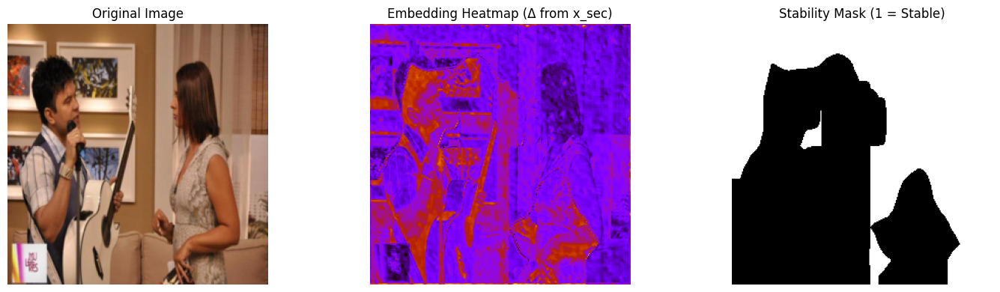

In [ ]:
import os
import torch
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms


image_path = "/content/data/images/class0"
image_files = sorted([f for f in os.listdir(image_path) if f.lower().endswith((".jpg", ".png"))])
img = image_files[567]
img = Image.open(os.path.join(image_path, img)).convert("RGB")

transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])
img_tensor = transform(img).unsqueeze(0).to(device)  # shape: [1, 3, 256, 256]


watermark = generate_random_watermark(1)  # shape: [1, 100]


with torch.no_grad():
    stability_mask = model(img_tensor)  # shape: [1, 1, 256, 256]


flat_mask = stability_mask.view(1, -1)
k = (256 * 256) // 2
_, topk_indices = torch.topk(flat_mask, k=k, largest=True, dim=1)
binary_mask = torch.zeros_like(flat_mask)
binary_mask.scatter_(1, topk_indices, 1.0)
mask = binary_mask.view(1, 1, 256, 256)  # 1 = stable

with torch.no_grad():
    x_sec = watermarker.sec_encoder(watermark, img_tensor, stability_mask)


def visualize_watermark_embedding(img, x_sec, mask):
    img = img.squeeze().detach().cpu()
    x_sec = x_sec.squeeze().detach().cpu()
    delta = torch.abs(img - x_sec).mean(dim=0)
    stability_mask = 1 - mask
    mask = stability_mask.squeeze().detach().cpu()

    plt.figure(figsize=(15, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(img.permute(1, 2, 0).clamp(0, 1))
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(delta, cmap='gnuplot')
    plt.title("Embedding Heatmap (Δ from x_sec)")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(mask, cmap="gray")
    plt.title("Stability Mask (1 = Stable)")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


visualize_watermark_embedding(img_tensor, x_sec, mask)


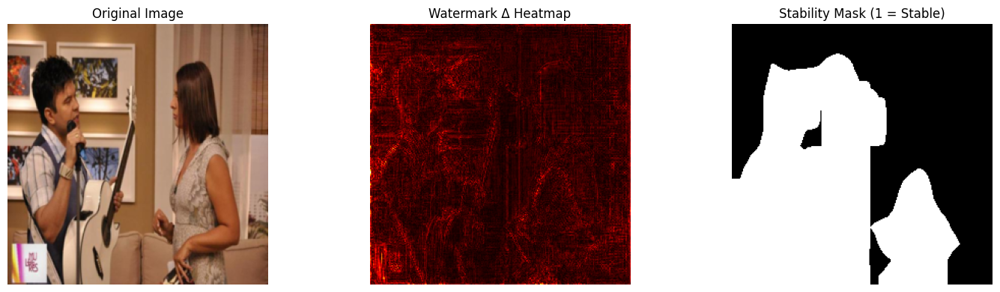

In [ ]:
with torch.no_grad():
    x_out = watermarker(img_tensor, secret=watermark)
delta = torch.abs(img_tensor - x_out).mean(dim=1, keepdim=True)  # [1, 1, H, W]
def visualize_embedding_map(original, watermarked, mask):
    original = original.squeeze().detach().cpu()
    watermarked = watermarked.squeeze().detach().cpu()
    delta = torch.abs(original - watermarked).mean(dim=0)  # [H, W]
    mask = mask.squeeze().detach().cpu()

    plt.figure(figsize=(15, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(original.permute(1, 2, 0).clamp(0, 1))
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(delta, cmap="hot")
    plt.title("Watermark Δ Heatmap")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(mask, cmap="gray")
    plt.title("Stability Mask (1 = Stable)")
    plt.axis("off")

    plt.tight_layout()
    plt.show()
visualize_embedding_map(img_tensor, x_out, mask)